In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import RobustScaler
from sklearn.svm import OneClassSVM
import matplotlib.pyplot as plt
from pandas.plotting import scatter_matrix

# 원본 데이터 로드
origin_df = pd.read_csv("./04_hashed.csv")

In [2]:
# IP 전처리
def transform_ip(ip): 
    groups = ip.split(".") 
    equalize_group_length = "".join( map( lambda group: group.zfill(3), groups )) 
    return equalize_group_length 

# Feature 전처리
def preprocess(df):
      
    # IP 전처리
    df['src_ip'] = df.src_ip.apply(lambda ip : transform_ip(ip))
    df['dst_ip'] = df.dst_ip.apply(lambda ip : transform_ip(ip))

    # country 전처리
    label_encoder = LabelEncoder()
    df['src_country'] = label_encoder.fit_transform(df['src_country'])
    df['dst_country'] = label_encoder.fit_transform(df['dst_country'])
    
    Robust_scaler = RobustScaler()
    # Feature에 scaler 적용 
    feature_trans = Robust_scaler.fit_transform(df)
    df = pd.DataFrame(feature_trans, columns=df.columns, index=df.index)
    
    return df

In [3]:
# 모델 학습 및 추론
def model(input_df, model_name):
    # Rdate를 제외한 Feature 선택
    feature_preprocess_df = input_df[["src_ip", "dst_ip", "Proto", "src_port", "dst_port", "Action", "src_country", "dst_country"]]
   
    # One Class SVM 모델 학습
    model = OneClassSVM(gamma='auto').fit(feature_preprocess_df)
    # 예측값 생성
    y_pred = model.predict(feature_preprocess_df)
    
    # 예측값 DataFrame화
    y_pred_df = pd.DataFrame(y_pred, columns=[f'{model_name}_y_pred'], index=feature_preprocess_df.index)
    # Feature 데이터와 예측값 concat
    result_df = pd.concat([feature_preprocess_df,y_pred_df],axis=1)
    return result_df, feature_preprocess_df, y_pred

In [4]:
# Rdate 종류
unique_time = origin_df['Rdate'].unique()

# Rdate를 제외한 나머지  Feature Scaling
preprocess_df = origin_df[["src_ip", "dst_ip", "Proto", "src_port", "dst_port", "Action", "src_country", "dst_country"]]
preprocess_df = preprocess(preprocess_df.astype(str))

# Rdate Feature 다시 추가
preprocess_df['Rdate'] = origin_df['Rdate']
preprocess_df

,src_ip,dst_ip,Proto,src_port,dst_port,Action,src_country,dst_country,Rdate
0,-6.199188e-10,-0.380463,0.0,-0.029567,0.000000,0.0,0.0,0.440299,2.021041e+13
1,-1.439812e-09,-0.154700,0.0,0.558866,0.000000,0.0,0.0,-0.828358,2.021041e+13
2,0.000000e+00,-0.236643,0.0,0.807966,0.000000,0.0,0.0,0.440299,2.021041e+13
3,9.998691e-12,0.670088,0.0,0.149981,0.000000,0.0,0.0,0.440299,2.021041e+13
4,-6.199188e-10,-0.484849,0.0,-0.029491,0.000000,0.0,0.0,0.440299,2.021041e+13
...,...,...,...,...,...,...,...,...,...
5820305,-1.418893e+00,-0.391406,0.0,0.840751,0.000000,0.0,0.0,0.440299,2.021041e+13
5820306,-1.418893e+00,0.279993,0.0,0.840904,0.000000,0.0,0.0,-0.888060,2.021041e+13
5820307,-8.840000e-02,-0.700039,0.0,-2.116967,-1.491166,0.0,-74.0,-0.365672,2.021041e+13
5820308,0.000000e+00,0.465016,0.0,0.103409,0.000000,0.0,0.0,-0.044776,2.021041e+13


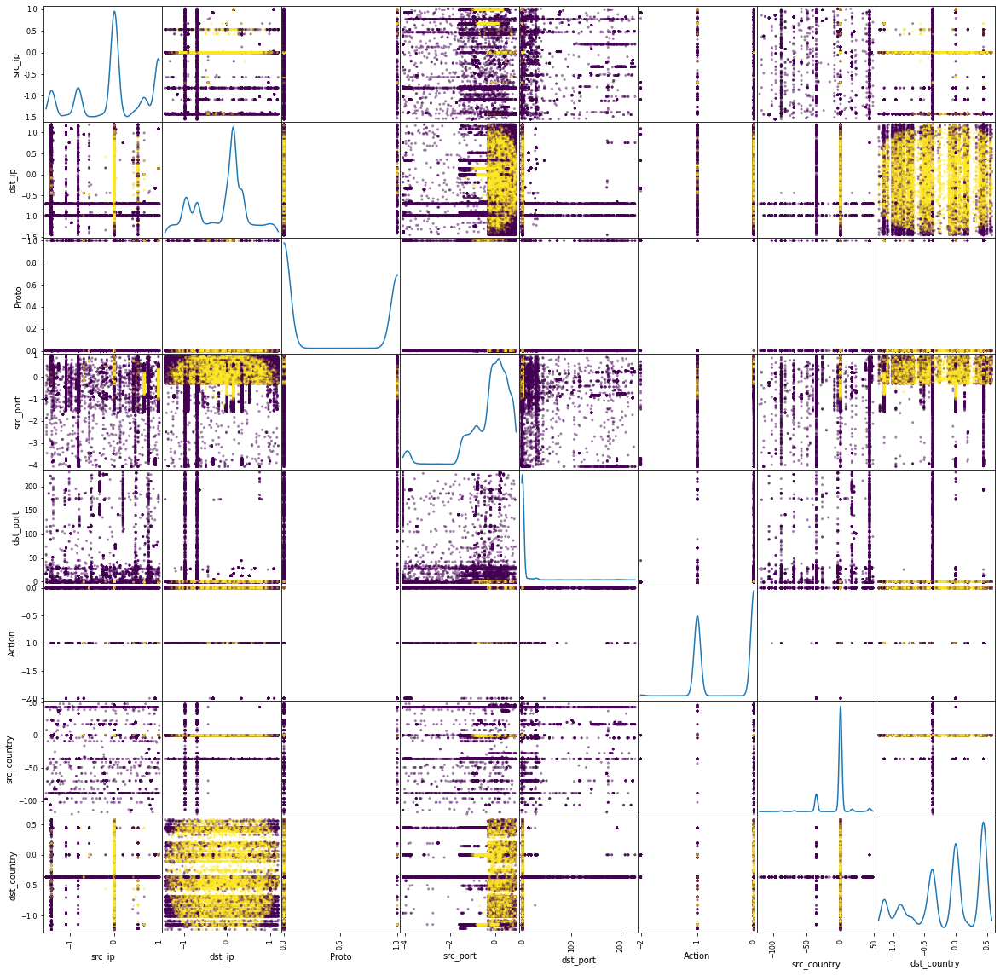

 @@@@@@@@@@@@@@@@@@@@ 24218 개 Rdate 중, 240 개 확인 완료 @@@@@@@@@@@@@@@@@@@@ 


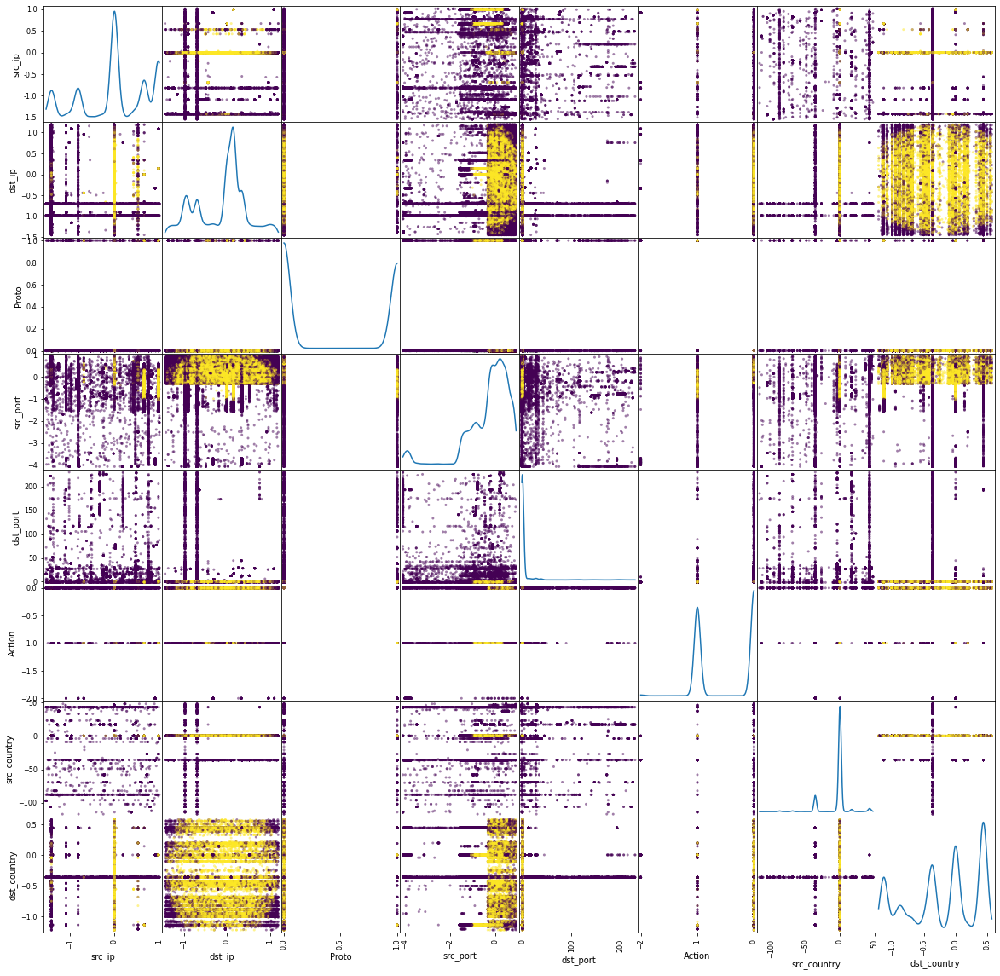

 @@@@@@@@@@@@@@@@@@@@ 24218 개 Rdate 중, 480 개 확인 완료 @@@@@@@@@@@@@@@@@@@@ 


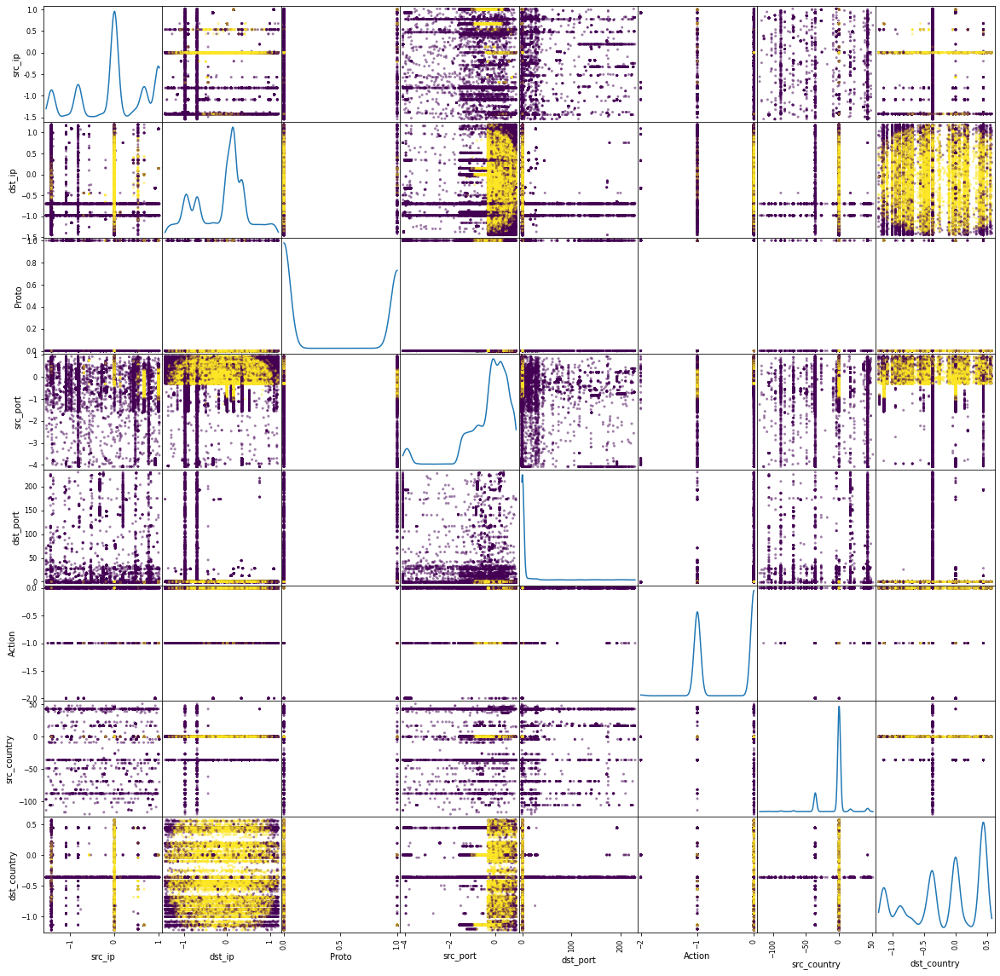

 @@@@@@@@@@@@@@@@@@@@ 24218 개 Rdate 중, 720 개 확인 완료 @@@@@@@@@@@@@@@@@@@@ 


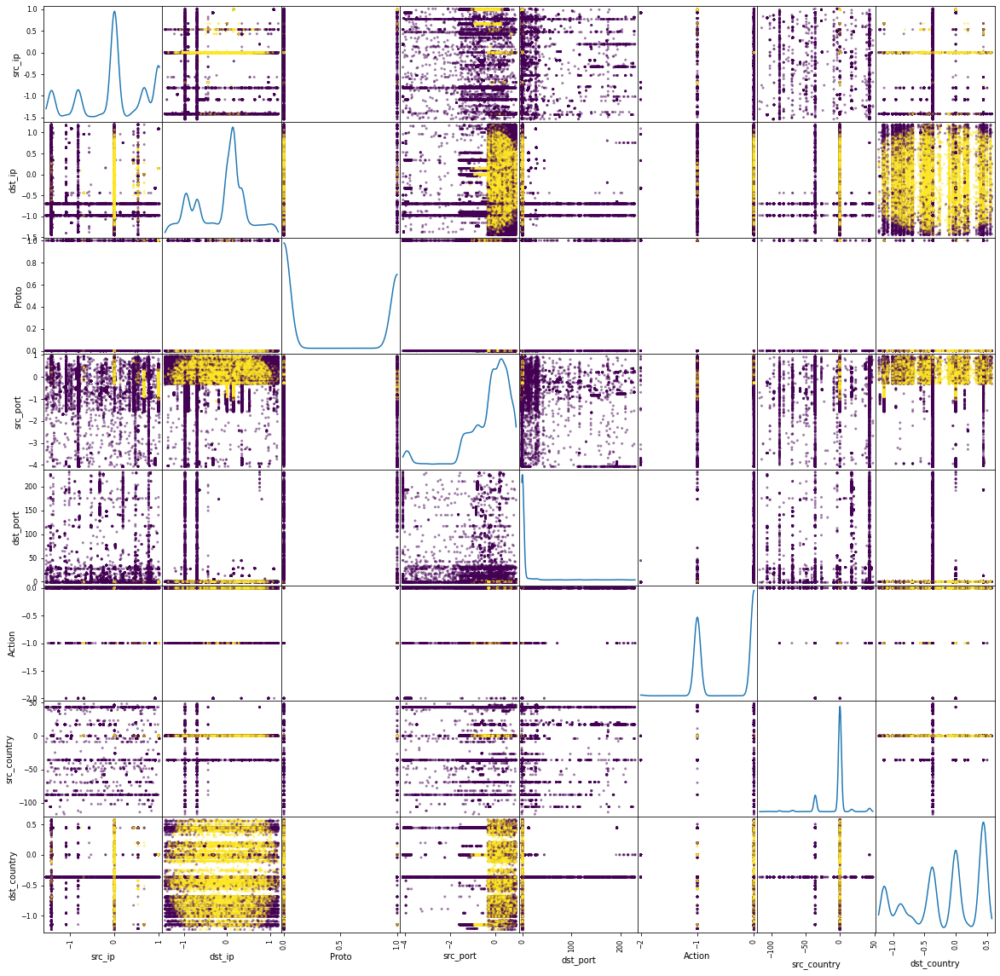

 @@@@@@@@@@@@@@@@@@@@ 24218 개 Rdate 중, 960 개 확인 완료 @@@@@@@@@@@@@@@@@@@@ 


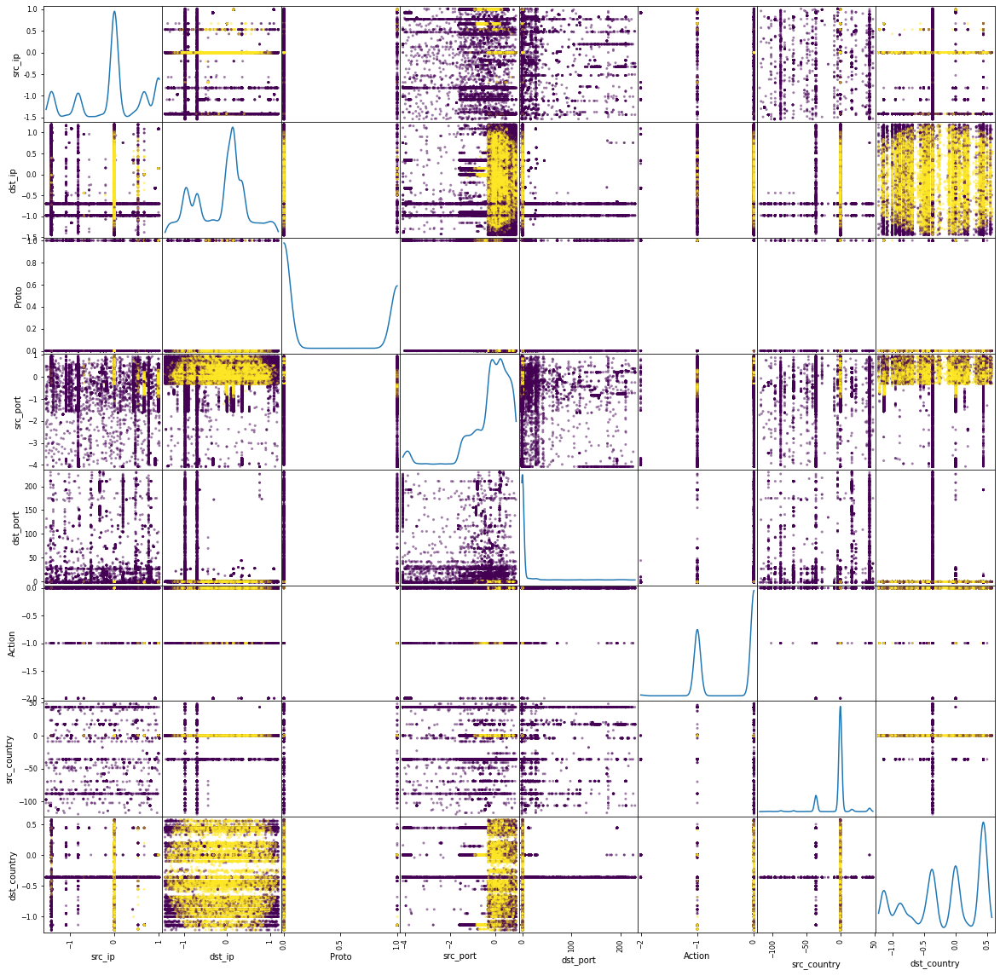

 @@@@@@@@@@@@@@@@@@@@ 24218 개 Rdate 중, 1200 개 확인 완료 @@@@@@@@@@@@@@@@@@@@ 


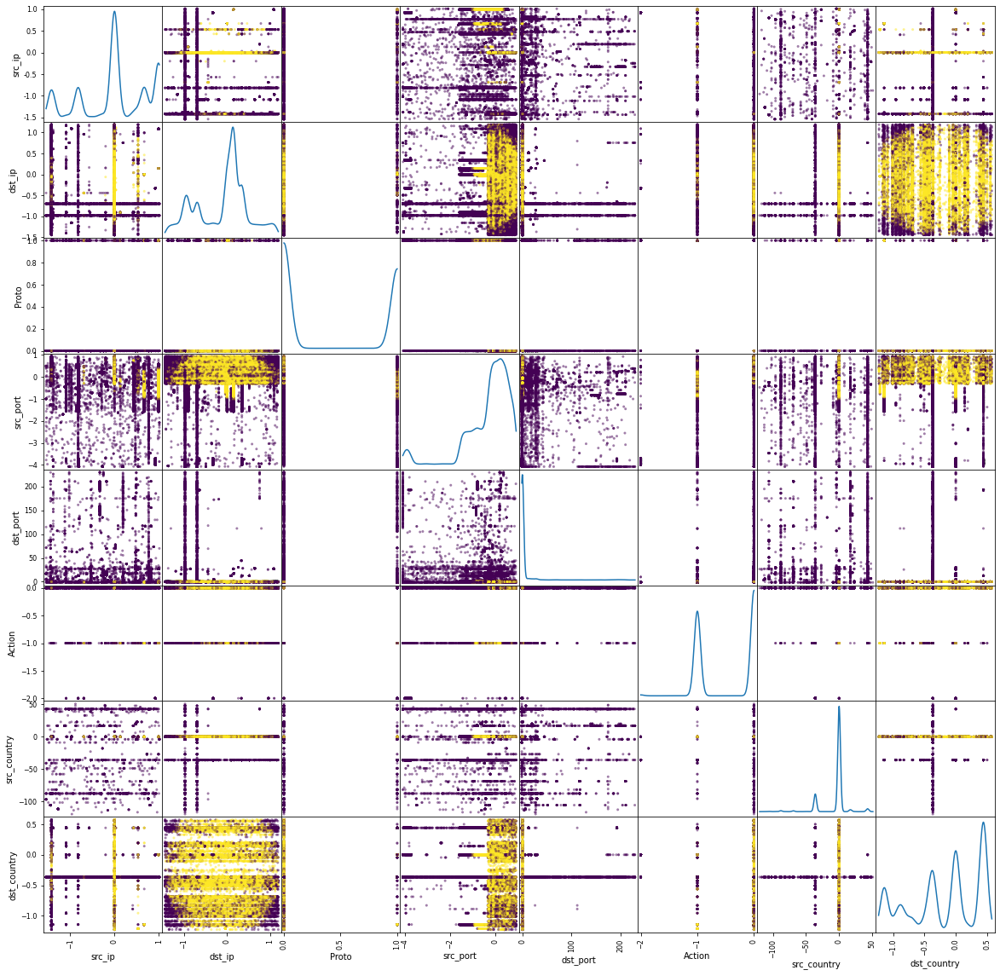

 @@@@@@@@@@@@@@@@@@@@ 24218 개 Rdate 중, 1440 개 확인 완료 @@@@@@@@@@@@@@@@@@@@ 


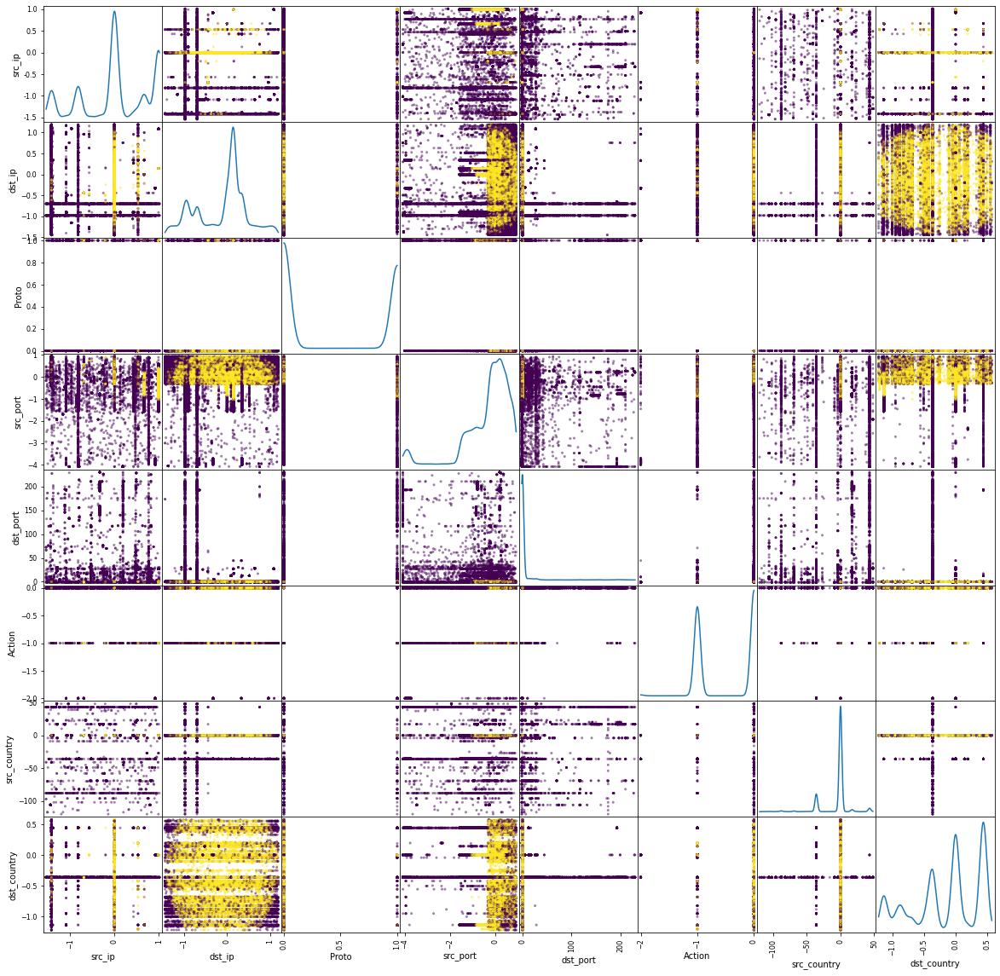

 @@@@@@@@@@@@@@@@@@@@ 24218 개 Rdate 중, 1680 개 확인 완료 @@@@@@@@@@@@@@@@@@@@ 


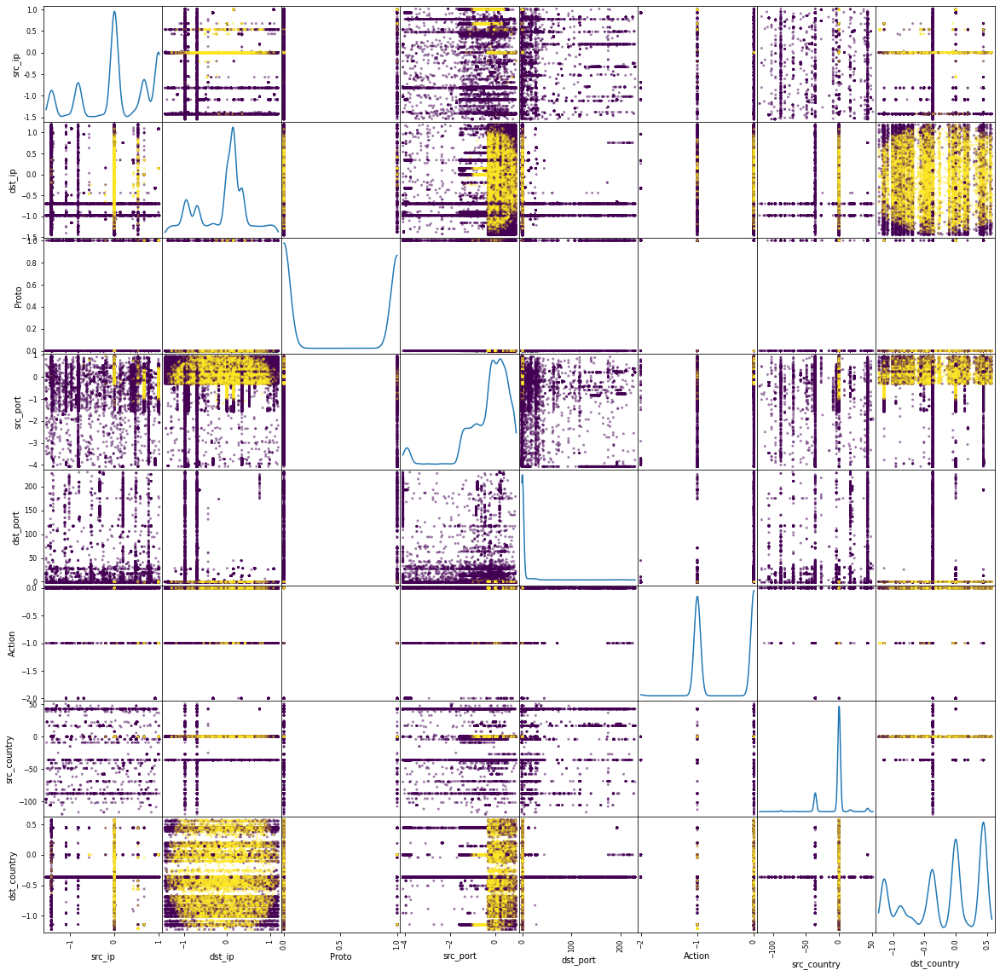

 @@@@@@@@@@@@@@@@@@@@ 24218 개 Rdate 중, 1920 개 확인 완료 @@@@@@@@@@@@@@@@@@@@ 


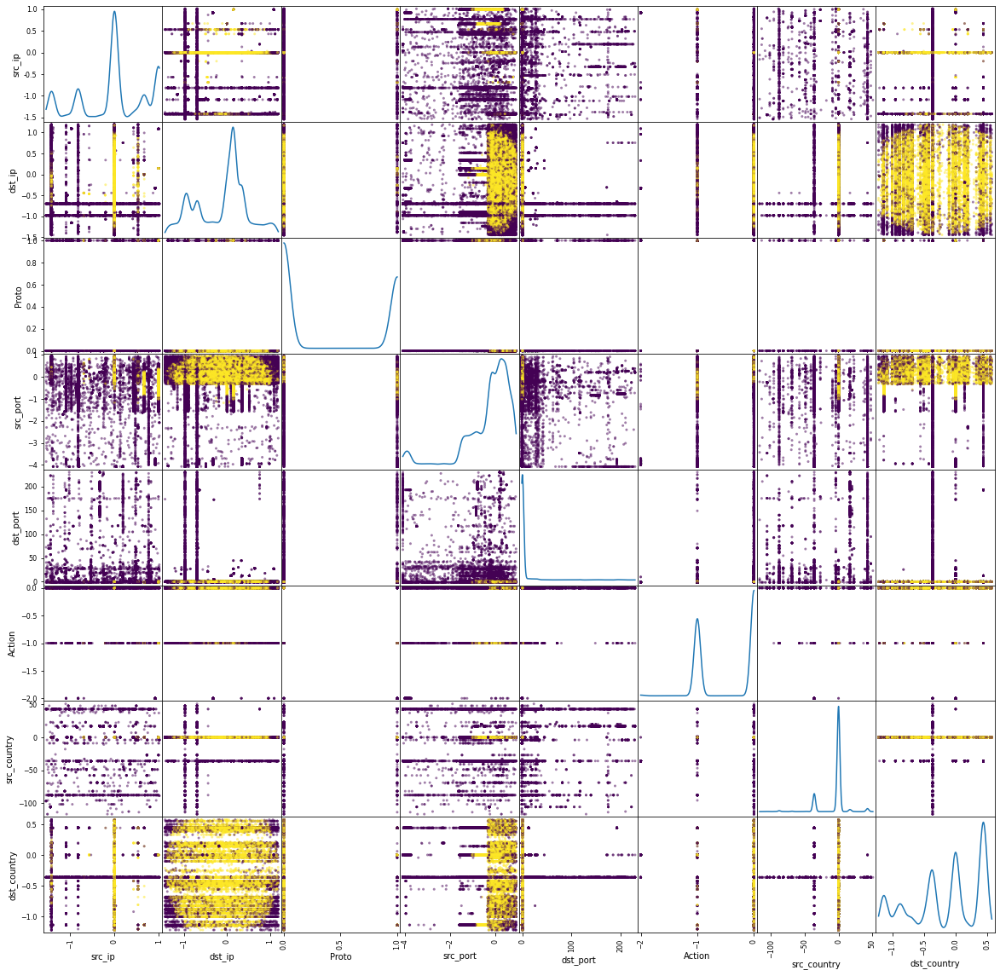

 @@@@@@@@@@@@@@@@@@@@ 24218 개 Rdate 중, 2160 개 확인 완료 @@@@@@@@@@@@@@@@@@@@ 


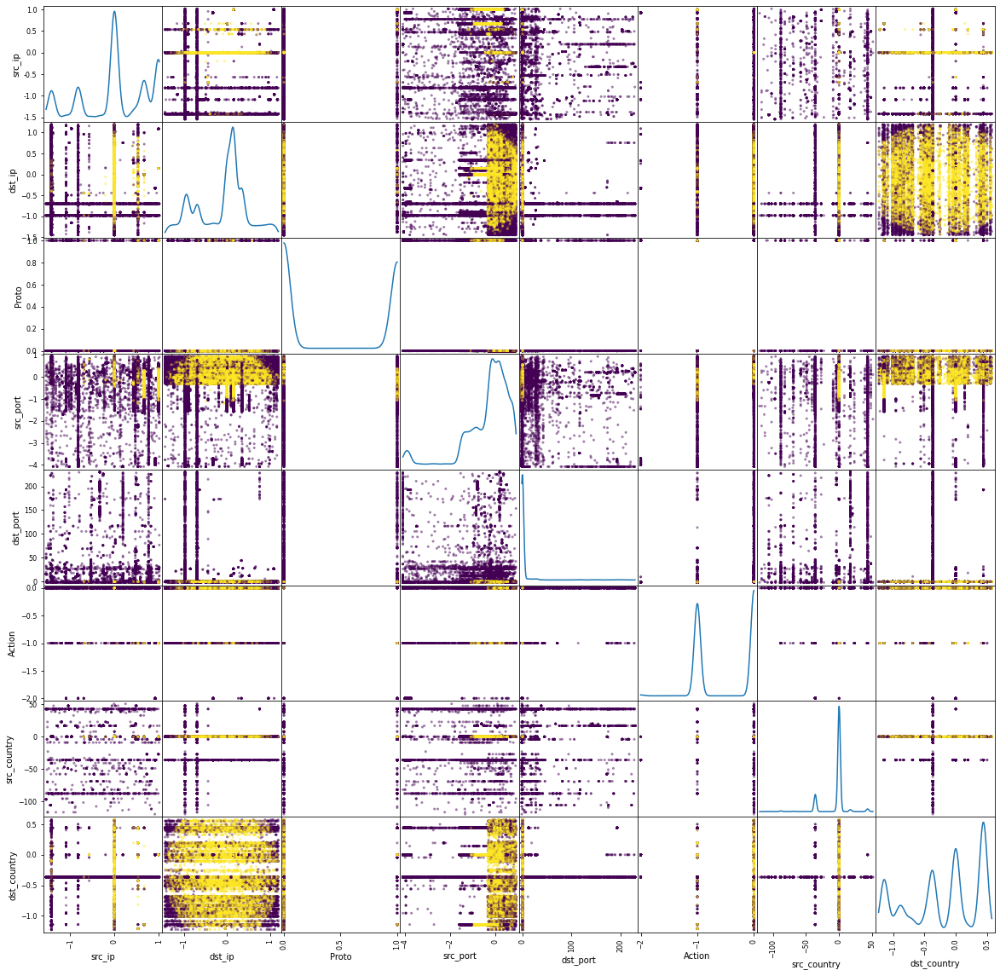

 @@@@@@@@@@@@@@@@@@@@ 24218 개 Rdate 중, 2400 개 확인 완료 @@@@@@@@@@@@@@@@@@@@ 


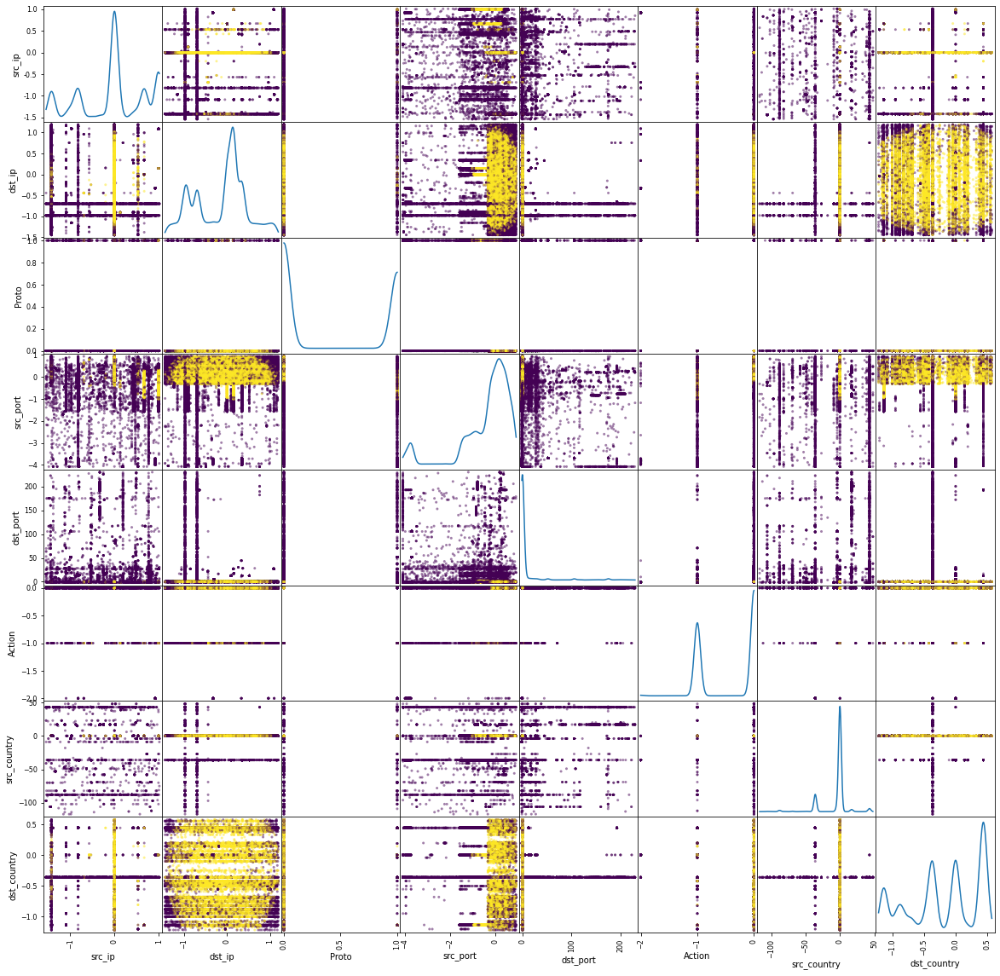

 @@@@@@@@@@@@@@@@@@@@ 24218 개 Rdate 중, 2640 개 확인 완료 @@@@@@@@@@@@@@@@@@@@ 


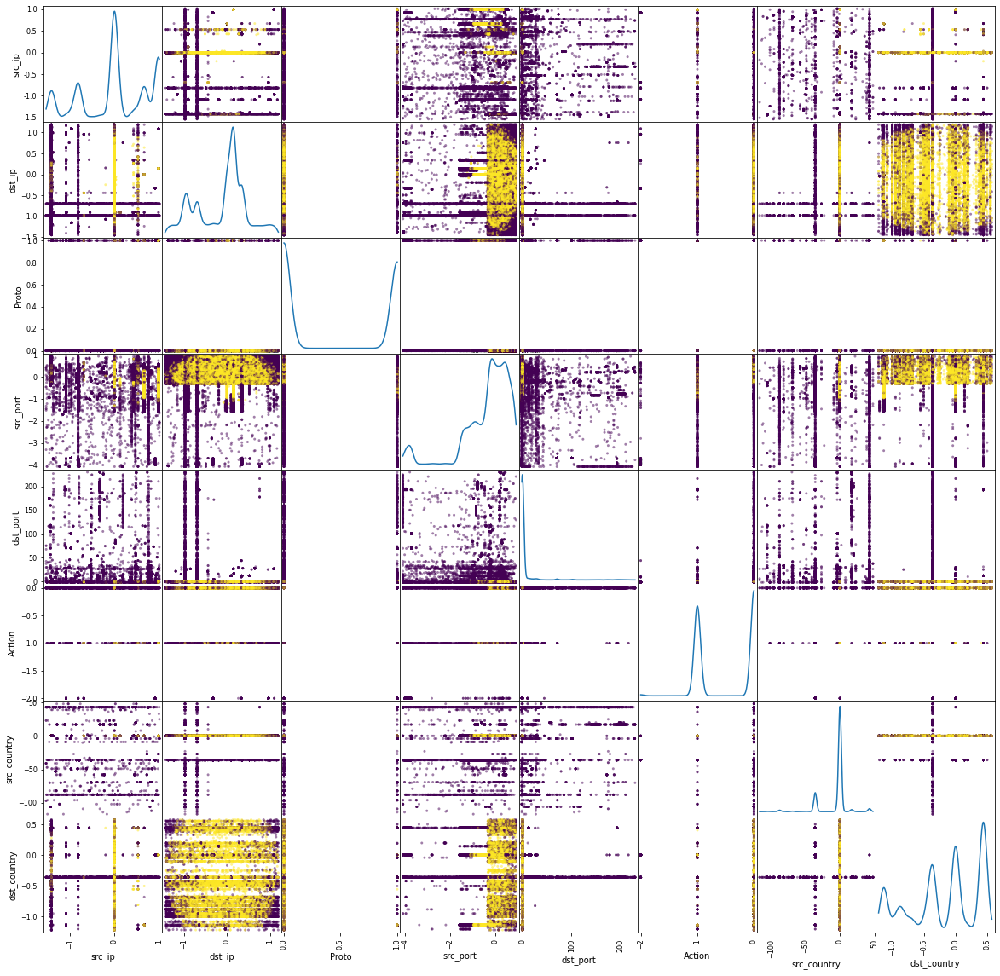

 @@@@@@@@@@@@@@@@@@@@ 24218 개 Rdate 중, 2880 개 확인 완료 @@@@@@@@@@@@@@@@@@@@ 


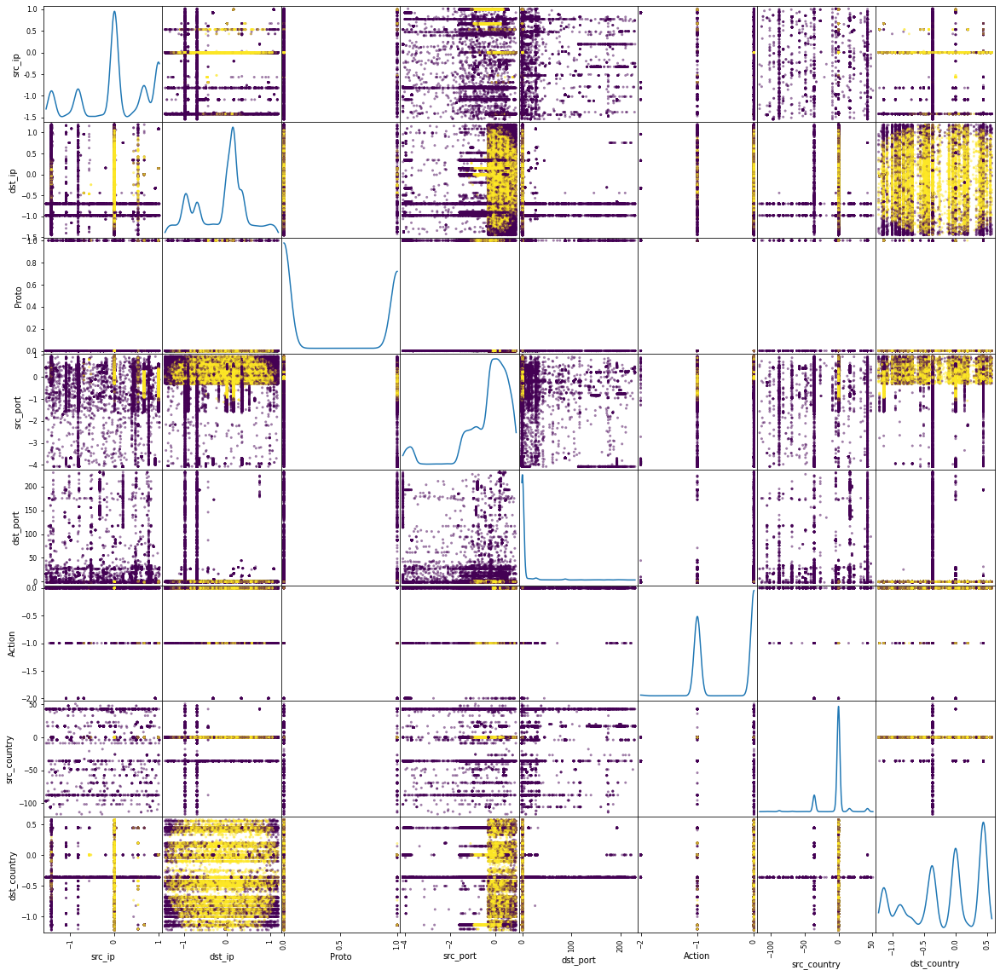

 @@@@@@@@@@@@@@@@@@@@ 24218 개 Rdate 중, 3120 개 확인 완료 @@@@@@@@@@@@@@@@@@@@ 


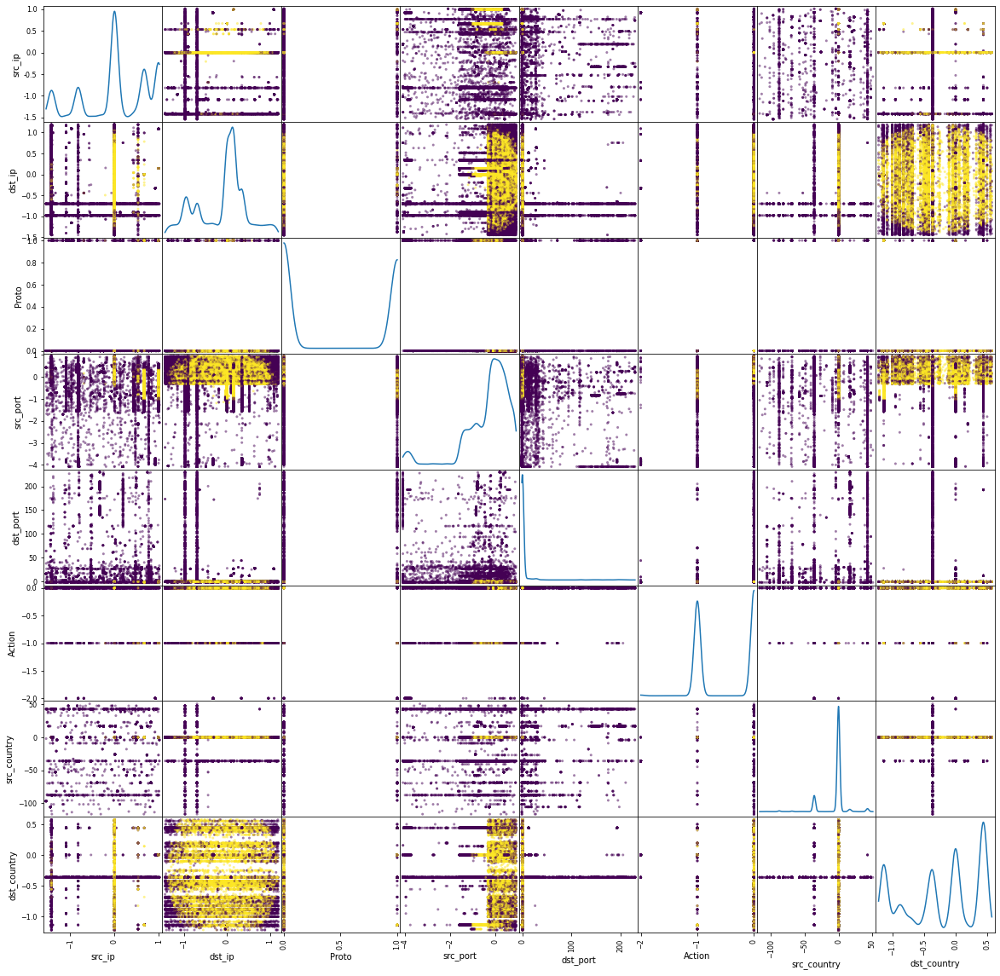

 @@@@@@@@@@@@@@@@@@@@ 24218 개 Rdate 중, 3360 개 확인 완료 @@@@@@@@@@@@@@@@@@@@ 


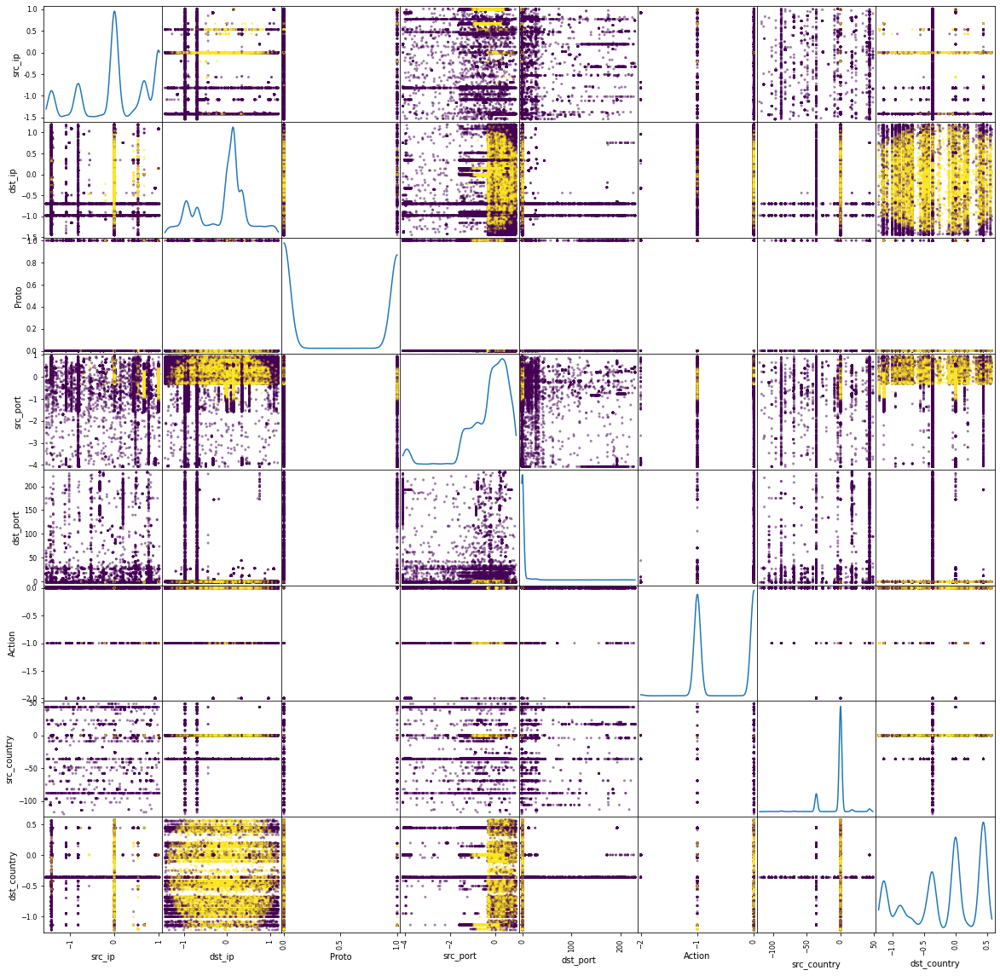

 @@@@@@@@@@@@@@@@@@@@ 24218 개 Rdate 중, 3600 개 확인 완료 @@@@@@@@@@@@@@@@@@@@ 


In [ ]:
# window size 선언
window_size = 240

# 전체 데이터 탐지 결과
total_result_df = pd.DataFrame()

last_search_index = len(unique_time)-window_size
count = 0
model_name = 'one_class_svm'

for i in range(0, last_search_index, window_size):
    # window df 생성
    window_df = pd.DataFrame()
    # window size 만큼 Rdate 탐색
    for j in range(window_size):
        # 전체 데이터를 순서대로 확인하며, Rdate 종류에 해당하는 데이터를 추출해 window df에 추가
        select_time = preprocess_df[preprocess_df['Rdate']==unique_time[i+j]]
        window_df = pd.concat([window_df,select_time])
        
    # 모델 실행
    result_df, feature_df, y_pred = model(window_df, model_name)
    total_result_df = pd.concat([total_result_df, result_df])
    
    scatter_matrix(feature_df,
               c = y_pred,
               alpha=0.5,
               figsize=(20, 20),
               diagonal='kde')
    
    plt.show()
    
    count += window_size
    print(" @@@@@@@@@@@@@@@@@@@@ %d 개 Rdate 중, %d 개 확인 완료 @@@@@@@@@@@@@@@@@@@@ " % (len(unique_time), count))
    

In [ ]:
# 탐지 결과 파일 저장
origin_df[f'{model_name}_y_pred'] = total_result_df[f'{model_name}_y_pred']
origin_df.to_csv(f"{model_name}_result.csv", index=False)
origin_df